## Hackathon Day 1
### Data Loading and Exploration

In the first day of our Hackathon, we learn about loading and preprocessing the data and get some insights in the data structure and explemplary instances.

### Task 1: Select a dataset and initialize it

As the first step, we need to import the data and initialize the Dataset object. It handles the download and the access to single data instances. A second important step when using data for machine learning is to think about a proper preprocessing pipeline. Raw data often has value ranges or data structured that need to be changed before it can be used in machine learning models. A convenient package to define preprocessing transformations is `torchvision` (https://pytorch.org/vision/)

* Import the PneumoniaMNIST data with the `medmnist` package (https://medmnist.com/) and initialize it using preprocessing.
* The PneumoniaMNIST dataset comes with several image sizes. Find out which sizes are available and visualize the differences.

The MNIST datasets (as also many of other common data sets) have 3 so-called "splits".

* What are the 3 splits of the data set?
* What is the purpose of each split?

In [1]:
from torchvision.transforms import v2 as transforms
import torch
from medmnist import PneumoniaMNIST

# preprocessing
data_transform = transforms.Compose(
    [
        # the `Compose` function can take a list of transformations (also called pipeline)
        # think of necessary prepreocessing functions here and add them to the list
        transforms.ToImage(),
        transforms.ToDtype(torch.float32, scale=True),
        transforms.Normalize(mean=[0.5], std=[0.5]),
    ]
)

# simple initialization of training-, validation-, and test-set:
train_dataset = PneumoniaMNIST(split="train", transform=data_transform, download=True, size=(224))
validation_dataset = PneumoniaMNIST(split="val", transform=data_transform, download=True, size=(224))
test_dataset = PneumoniaMNIST(split="test", transform=data_transform, download=True, size=(224))

Using downloaded and verified file: /Users/mguender/.medmnist/pneumoniamnist_224.npz
Using downloaded and verified file: /Users/mguender/.medmnist/pneumoniamnist_224.npz
Using downloaded and verified file: /Users/mguender/.medmnist/pneumoniamnist_224.npz


### Task 2: Visualize the dataset

A visual exploration of the data should be one of your first steps when conducting a machine learning project. It helps to get familiar with the data structure and quality. Especially for use-case-tailored modeling task, it is essential to have a broad knowledge about the properties and characteristics of your data.

* Print out some properties of the datasets initialized before
* Visualize some example instances by using the `medmnist` package

Training Dataset:
Dataset PneumoniaMNIST of size 224 (pneumoniamnist_224)
    Number of datapoints: 4708
    Root location: /Users/mguender/.medmnist
    Split: train
    Task: binary-class
    Number of channels: 1
    Meaning of labels: {'0': 'normal', '1': 'pneumonia'}
    Number of samples: {'train': 4708, 'val': 524, 'test': 624}
    Description: The PneumoniaMNIST is based on a prior dataset of 5,856 pediatric chest X-Ray images. The task is binary-class classification of pneumonia against normal. We split the source training set with a ratio of 9:1 into training and validation set and use its source validation set as the test set. The source images are gray-scale, and their sizes are (384−2,916)×(127−2,713). We center-crop the images and resize them into 1×28×28.
    License: CC BY 4.0


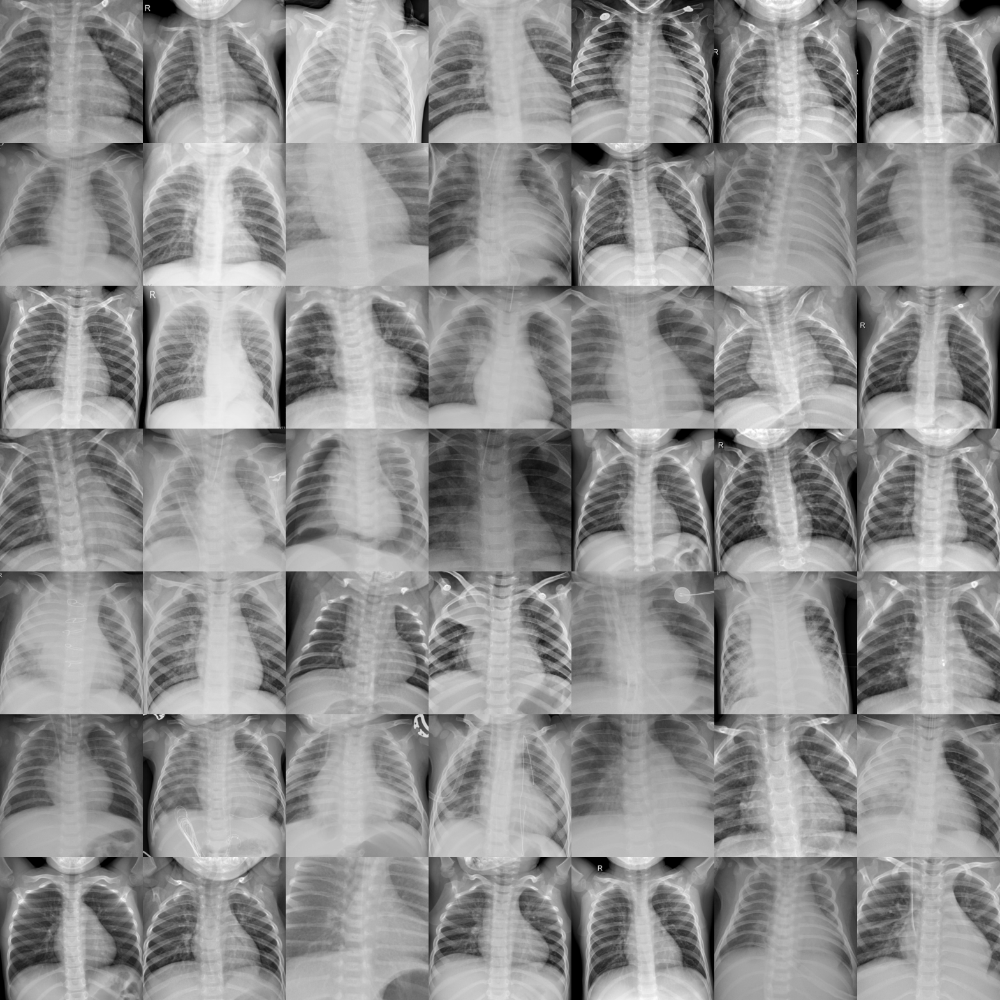

Validation Dataset:
Dataset PneumoniaMNIST of size 224 (pneumoniamnist_224)
    Number of datapoints: 524
    Root location: /Users/mguender/.medmnist
    Split: val
    Task: binary-class
    Number of channels: 1
    Meaning of labels: {'0': 'normal', '1': 'pneumonia'}
    Number of samples: {'train': 4708, 'val': 524, 'test': 624}
    Description: The PneumoniaMNIST is based on a prior dataset of 5,856 pediatric chest X-Ray images. The task is binary-class classification of pneumonia against normal. We split the source training set with a ratio of 9:1 into training and validation set and use its source validation set as the test set. The source images are gray-scale, and their sizes are (384−2,916)×(127−2,713). We center-crop the images and resize them into 1×28×28.
    License: CC BY 4.0


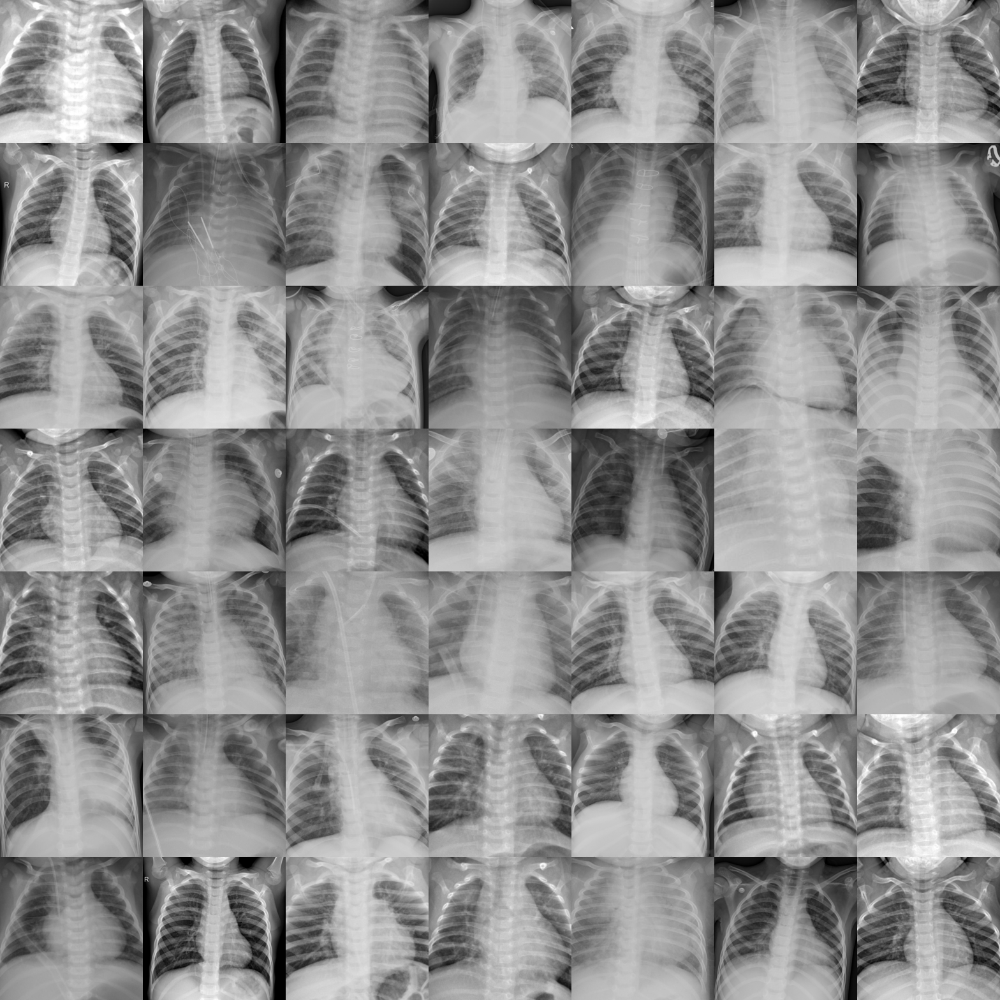

Test Dataset:
Dataset PneumoniaMNIST of size 224 (pneumoniamnist_224)
    Number of datapoints: 624
    Root location: /Users/mguender/.medmnist
    Split: test
    Task: binary-class
    Number of channels: 1
    Meaning of labels: {'0': 'normal', '1': 'pneumonia'}
    Number of samples: {'train': 4708, 'val': 524, 'test': 624}
    Description: The PneumoniaMNIST is based on a prior dataset of 5,856 pediatric chest X-Ray images. The task is binary-class classification of pneumonia against normal. We split the source training set with a ratio of 9:1 into training and validation set and use its source validation set as the test set. The source images are gray-scale, and their sizes are (384−2,916)×(127−2,713). We center-crop the images and resize them into 1×28×28.
    License: CC BY 4.0


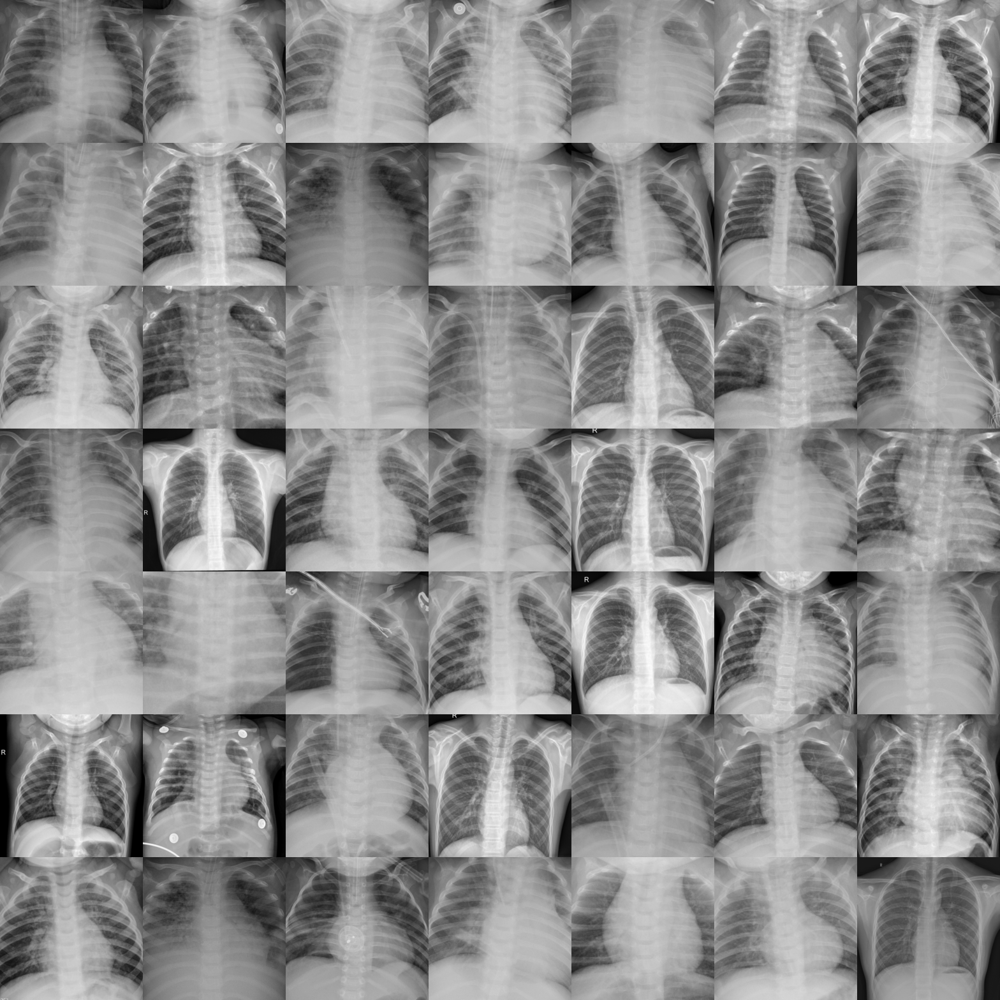

In [2]:
# Visualize properties and qualitative samples of training-set:
print("Training Dataset:")
print(train_dataset)
display(train_dataset.montage(length=7))
print("=======================================================")
# Visualize properties and qualitative samples of validation-set:
print("Validation Dataset:")
print(validation_dataset)
display(validation_dataset.montage(length=7))
print("=======================================================")
# Visualize properties and qualitative samples of test-set:
print("Test Dataset:")
print(test_dataset)
display(test_dataset.montage(length=7))
print("=======================================================")

As the dataset information shows, we have a binary classification task. The label '0' represents a normal chest X-Ray, whereas a label '1' represents a chest X-Ray where pneumonia is visible. Thus, it might be useful to see, if we already see differences in instances that have different labels.

* Write the code that visualizes 10 examples images from the train dataset for 'normal' and 'pneumonia' labels each using the `matplotlib` package (https://matplotlib.org/)

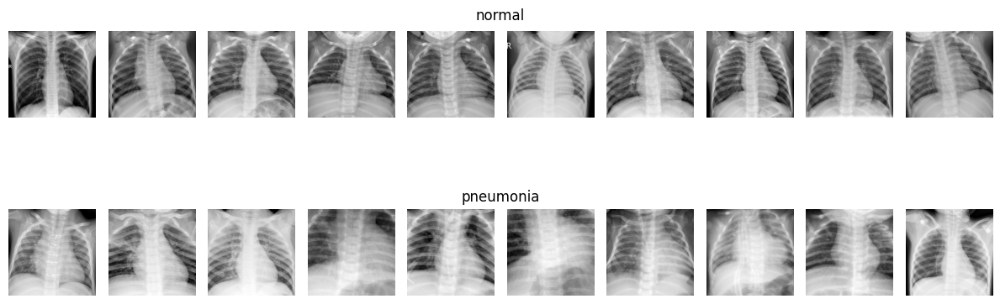

In [3]:
import matplotlib.pyplot as plt
%matplotlib inline

fig, axes = plt.subplots(2,10, figsize=(12, 6))
for n in range(2):
    count=0
    for img, label in train_dataset:
        if label[0]==n and count<10:
            axes[n,count].imshow(img[0],cmap="binary_r")
            axes[n,count].axis("off")
            count+=1

# Set titles for the rows
fig.text(0.5, 0.76, "normal", ha='center', fontsize=12)
fig.text(0.5, 0.4, "pneumonia", ha='center', fontsize=12)

# Adjust layout to ensure titles don't overlap with images
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

* Can you see significant differences between both labels? Briefly explain your findigs 

### Task 3: Plot class distributions

Another recommendable staight-forward exploration method is to have a look into the class label distributions, so how many instances are available for each label.

* Find a way to extract the labels for each of the 3 data sets (train, validation, test)
* Count the labels for each set

Hint: Use the `numpy` package

In [4]:
import numpy as np


# Helper function to extract the labels of the dataset
def get_labels(dataset):
    labels = []
    for _, label in dataset:
        labels.extend(label)
    return np.array(labels)


# Extract labels for each split
train_labels = get_labels(train_dataset)
validation_labels = get_labels(validation_dataset)
test_labels = get_labels(test_dataset)

# Calculate class counts for each split
train_counts = np.bincount(train_labels, minlength=2)
val_counts = np.bincount(validation_labels, minlength=2)
test_counts = np.bincount(test_labels, minlength=2)

Now, that we have the label counts, we want to visualize them for example as a bar plot. Again, use `matplotlib` for that.

* "easy" task: Make a separate class distribution bar plot for each set
* "advanced" task: Make a stacked bar plot for all class distributions

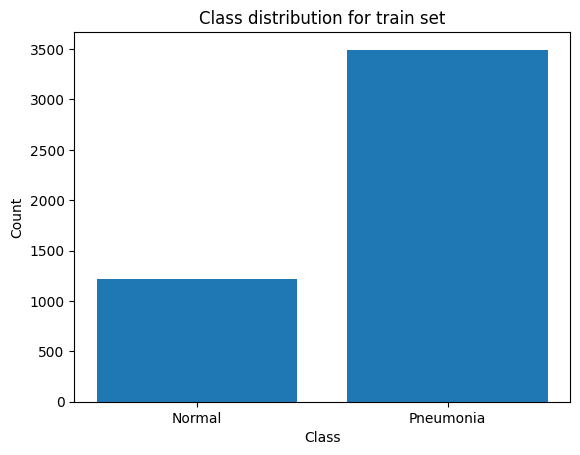

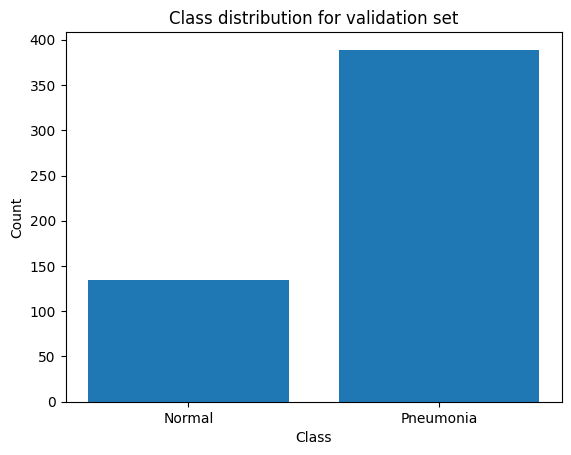

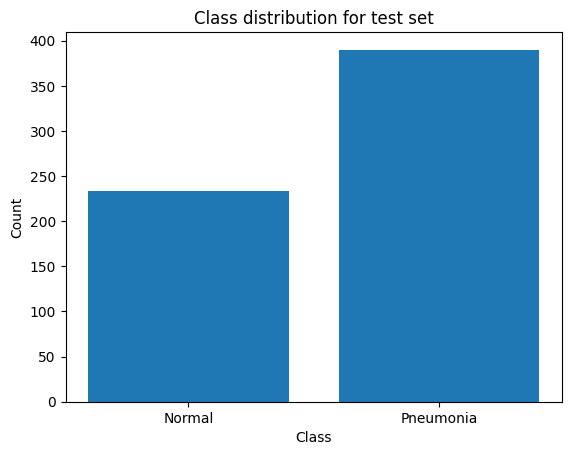

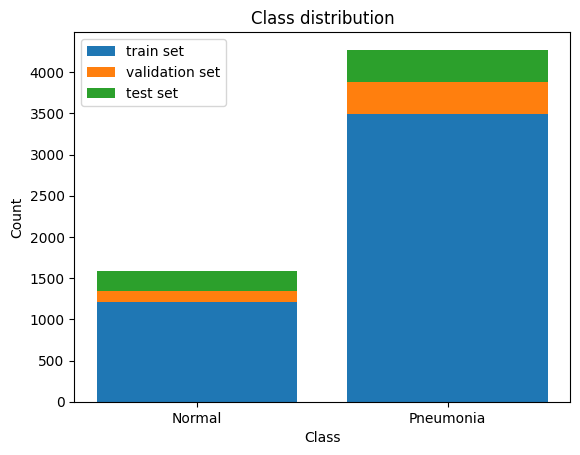

In [5]:
# Labels for plotting
labels_names = ["Normal", "Pneumonia"]

# Easy: Create single bar plots
for counts, split in zip([train_counts, val_counts, test_counts], ["train", "validation", "test"]):
    fig, ax = plt.subplots()
    ax.bar(labels_names, counts)
    ax.set_xlabel("Class")
    ax.set_ylabel("Count")
    ax.set_title(f"Class distribution for {split} set")
    plt.show()

# Advanced: Create a stacked bar plot
fig, ax = plt.subplots()
ax.bar(labels_names, train_counts, label="train set")
ax.bar(labels_names, val_counts, bottom=train_counts, label="validation set")
ax.bar(labels_names, test_counts, bottom=train_counts + val_counts, label="test set")

ax.set_xlabel("Class")
ax.set_ylabel("Count")
ax.set_title("Class distribution")
ax.legend()

plt.show()

Discribe your findings

* Can you see something remarkable?
* How are the labels distributed?
* Are there implications / difficulties that may occur during model training?

### Task 4 (optional): Data augmentation

####  Torchvision Augmentation

For the very most machine learning problems it is: the more data, the better. The higher the variety of the data, the more knowledge the model can gain from it which increases its accuracy. Of course, the total amount of data is limited and especially in medical imaging, data acquisition is fairly expensive. However, there are methods to increase the dataset size by artificial instances that are "close" or "similar" to the real data instances by manipulation of the existing real data. This principle is known as *Data Augmentation*.

In the field of (medical) image processing, we can augment our data e.g. by rotating, mirroring, or cropping existing images. Also changes in brightness, contrast, resolution, or adding random noise are possible. Basically, any augmentation method that leads to realistic representation and transformations of the real data is helpful.

In general torchvision transforms (https://pytorch.org/vision/stable/transforms.html) provide a module for data transformations and augmentation. The torchvision transforms can be composed in a seuential transform and applied on the fly when passed to the dataset object


In [6]:
train_transforms = transforms.Compose(
    [
        transforms.ToImage(),  # Convert to tensor, only needed if you have a PIL image
        transforms.RandomAutocontrast(),
        transforms.GaussianBlur(kernel_size=3),
        transforms.ToDtype(torch.float32, scale=True),
        transforms.Normalize(mean=[0.5], std=[0.5]),
    ]
)  # Normalize expects float input


train_dataset = PneumoniaMNIST(split="train", transform=train_transforms, download=True)

Using downloaded and verified file: /Users/mguender/.medmnist/pneumoniamnist.npz


check if the images are transformed in the dataset on the fly.

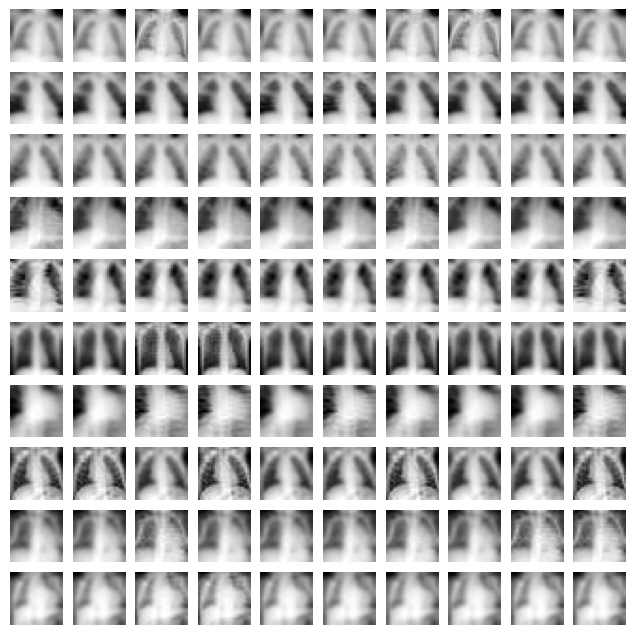

In [7]:
from mpl_toolkits.axes_grid1 import ImageGrid

fig = plt.figure(figsize=(8, 8))
grid = ImageGrid(fig, 111, nrows_ncols=(10, 10), axes_pad=0.1)

sample_images = [train_dataset[row_idx][0] for row_idx in range(10) for col_idx in range(10)]
for ax, im in zip(grid, sample_images):
    ax.imshow(im[0], cmap="gray")
    ax.axis("off")

plt.show()

#### MONAI augmentation

Especially for medial imaging, `MONAI` (https://monai.io/) is a powerful Python framework for machine learning in medical applications and, in particular, also provides image augmentation methods. Refer here https://docs.monai.io/en/stable/transforms.html.

In [8]:
# import monai libraries

import random
from monai.data import DataLoader, CacheDataset
from monai.utils import GridSamplePadMode
from monai.transforms import Compose, EnsureTyped, ScaleIntensityd, RandFlipd, RandAffined, RandGaussianNoised

In [9]:
data_transforms = Compose([EnsureTyped(keys=["image"], data_type="tensor"), ScaleIntensityd(keys=["image"], minv=0, maxv=1)])

# You can also randomly rotate or flip your dataset, apply gaussian noise, etc. to create more variability in the dataset

train_transforms = Compose(
    [
        EnsureTyped(keys=["image"], data_type="tensor"),
        RandFlipd(keys=["image"], prob=0.25, spatial_axis=1),
        RandAffined(
            keys=["image"],
            mode=("bilinear"),
            prob=0.5,
            shear_range=0.1,
            spatial_size=[224, 224],
            rotate_range=np.pi / 180 * 20,
            scale_range=0.1,
            padding_mode=GridSamplePadMode.BORDER,
        ),
        RandGaussianNoised(
            keys=["image"],
            prob=0.25,
            std=0.1,
        ),
        ScaleIntensityd(keys=["image"], minv=0, maxv=1),
    ]
)


# If you want to use Monai data transformations you have to use a wrapper class on PneumoniaMNIST to return the images and respective labels in the MONAI compatible format
class WrappedPneumoniaMNIST(PneumoniaMNIST):
    def __getitem__(self, index):
        image, label = super().__getitem__(index)
        image = torch.tensor(np.array(image)).unsqueeze(0)
        return {"image": image, "label": label}


# Load Pneumonia datase for training, validation and test
size = 224
train_dataset = WrappedPneumoniaMNIST(split="train", download=True, size=size)
val_dataset = WrappedPneumoniaMNIST(split="val", download=True, size=size)
test_dataset = WrappedPneumoniaMNIST(split="test", download=True, size=size)

# Wrap with MONAI CacheDataset
# Attention: If you use data augmentation, only apply it to training data and not to the validation and test set as we want to keep them unchanged.
train_monai_dataset = CacheDataset(data=train_dataset, transform=train_transforms, cache_rate=1.0, num_workers=4)
val_monai_dataset = CacheDataset(data=val_dataset, transform=data_transforms, cache_rate=1.0, num_workers=4)
test_monai_dataset = CacheDataset(data=test_dataset, transform=data_transforms, cache_rate=1.0, num_workers=4)

Using downloaded and verified file: /Users/mguender/.medmnist/pneumoniamnist_224.npz
Using downloaded and verified file: /Users/mguender/.medmnist/pneumoniamnist_224.npz
Using downloaded and verified file: /Users/mguender/.medmnist/pneumoniamnist_224.npz


Loading dataset: 100%|██████████| 624/624 [00:00<00:00, 5127.07it/s]


We can visualize data augmentation by selecting random samples from the dataset

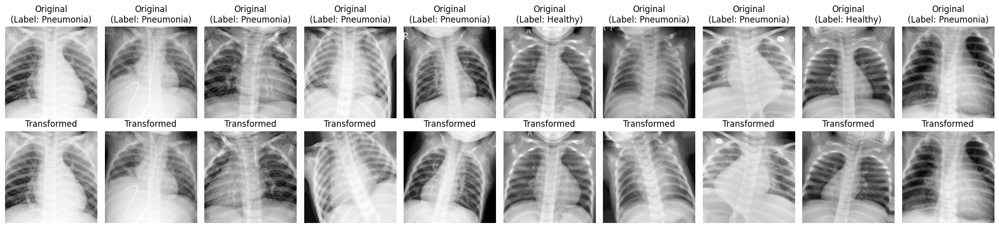

In [10]:
# Show 10 images
num_samples = 10

# Create a list with random indices
random_indices = random.sample(range(len(train_monai_dataset)), num_samples)

fig, axs = plt.subplots(2, num_samples, figsize=(20, 5))

for i, idx in enumerate(random_indices):
    orig_img = train_monai_dataset.data.imgs[idx]
    transformed_img = train_monai_dataset[idx]["image"]
    label = train_monai_dataset[idx]["label"]
    if label == 0:
        label_str = "Healthy"
    else:
        label_str = "Pneumonia"

    # Show image
    axs[0, i].imshow(orig_img, cmap="gray")
    axs[0, i].axis("off")
    axs[0, i].set_title(f"Original\n(Label: {label_str})")

    axs[1, i].imshow(transformed_img.squeeze(), cmap="gray")
    axs[1, i].axis("off")
    axs[1, i].set_title(f"Transformed")

plt.tight_layout(rect=[0, 0, 1, 0.95])  # for nice plots
plt.show()

### Task 5: Dataloader 

Training on large datasets all at once may exceed memory limits. Batching allows models to handle smaller chunks of data, fitting them into memory more easily. A DataLoader efficiently loads and manages data by handling batching, shuffling, and parallel processing. It feeds data into models during training and evaluation. Usually, we provide a dataset and batch size to the dataloader to create mini-batches out of the whole dataset.

In [11]:
from torch.utils.data import DataLoader

train_dataloader = DataLoader(dataset=train_dataset, batch_size=16, shuffle=True)

val_dataloader = DataLoader(dataset=validation_dataset, batch_size=16, shuffle=False)

test_dataloader = DataLoader(dataset=test_dataset, batch_size=16, shuffle=False)

### Task 6 (optional): ChestMNIST

Now, we have a look at another `medmnist` dataset - ChestMNIST.

* Initialize the ChestMNIST data sets with a preprocessing

In [12]:
from medmnist import ChestMNIST

# preprocessing
data_transform = transforms.Compose(
    [
        # the `Compose` function can take a list of transformations (also called pipeline)
        # think of necessary prepreocessing functions here and add them to the list
        transforms.ToImage(),
        transforms.ToDtype(torch.float32, scale=True),
        transforms.Normalize(mean=[0.5], std=[0.5]),
    ]
)

# simple initialization of training-, validation-, and test-set:
train_dataset = ChestMNIST(split="train", transform=data_transform, download=True, size=(224))
validation_dataset = ChestMNIST(split="val", transform=data_transform, download=True, size=(224))
test_dataset = ChestMNIST(split="test", transform=data_transform, download=True, size=(224))

Using downloaded and verified file: /Users/mguender/.medmnist/chestmnist_224.npz
Using downloaded and verified file: /Users/mguender/.medmnist/chestmnist_224.npz
Using downloaded and verified file: /Users/mguender/.medmnist/chestmnist_224.npz


Print out some data set properties and example images:

Training Dataset:
Dataset ChestMNIST of size 224 (chestmnist_224)
    Number of datapoints: 78468
    Root location: /Users/mguender/.medmnist
    Split: train
    Task: multi-label, binary-class
    Number of channels: 1
    Meaning of labels: {'0': 'atelectasis', '1': 'cardiomegaly', '2': 'effusion', '3': 'infiltration', '4': 'mass', '5': 'nodule', '6': 'pneumonia', '7': 'pneumothorax', '8': 'consolidation', '9': 'edema', '10': 'emphysema', '11': 'fibrosis', '12': 'pleural', '13': 'hernia'}
    Number of samples: {'train': 78468, 'val': 11219, 'test': 22433}
    Description: The ChestMNIST is based on the NIH-ChestXray14 dataset, a dataset comprising 112,120 frontal-view X-Ray images of 30,805 unique patients with the text-mined 14 disease labels, which could be formulized as a multi-label binary-class classification task. We use the official data split, and resize the source images of 1×1024×1024 into 1×28×28.
    License: CC BY 4.0


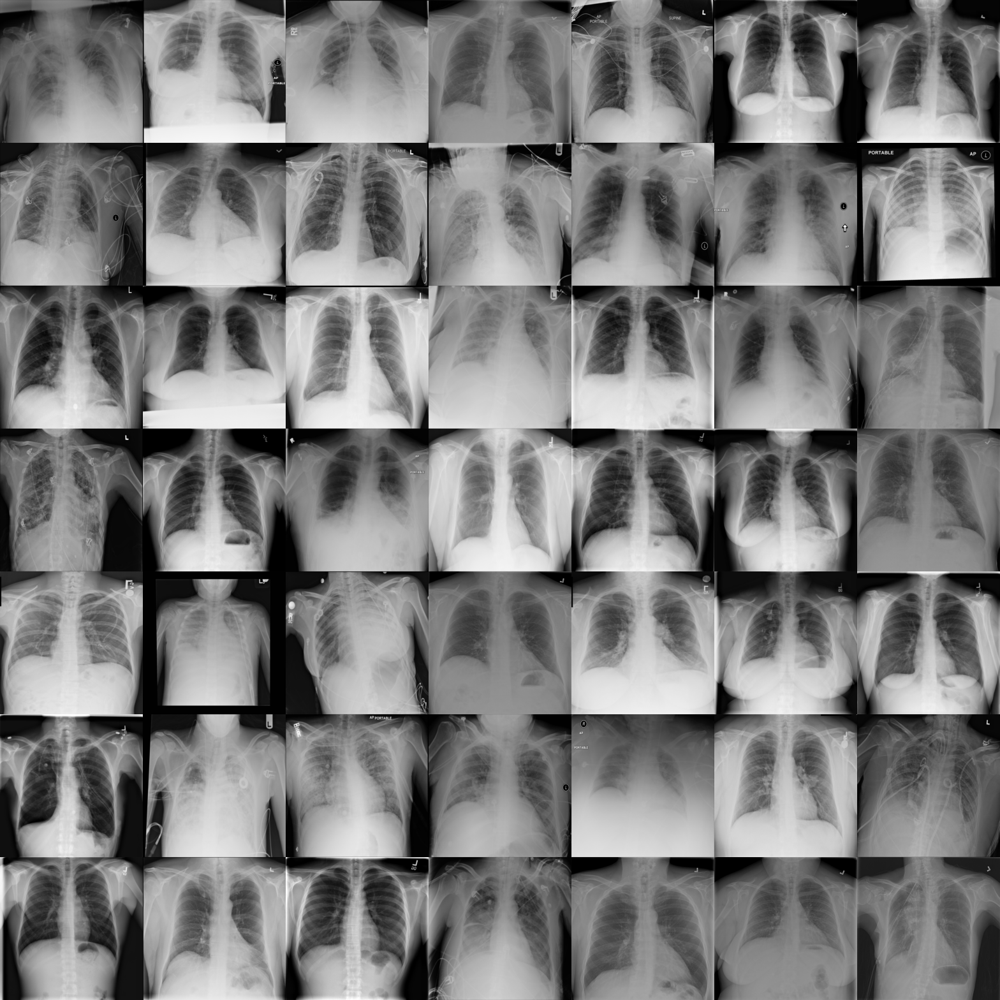

Validation Dataset:
Dataset ChestMNIST of size 224 (chestmnist_224)
    Number of datapoints: 11219
    Root location: /Users/mguender/.medmnist
    Split: val
    Task: multi-label, binary-class
    Number of channels: 1
    Meaning of labels: {'0': 'atelectasis', '1': 'cardiomegaly', '2': 'effusion', '3': 'infiltration', '4': 'mass', '5': 'nodule', '6': 'pneumonia', '7': 'pneumothorax', '8': 'consolidation', '9': 'edema', '10': 'emphysema', '11': 'fibrosis', '12': 'pleural', '13': 'hernia'}
    Number of samples: {'train': 78468, 'val': 11219, 'test': 22433}
    Description: The ChestMNIST is based on the NIH-ChestXray14 dataset, a dataset comprising 112,120 frontal-view X-Ray images of 30,805 unique patients with the text-mined 14 disease labels, which could be formulized as a multi-label binary-class classification task. We use the official data split, and resize the source images of 1×1024×1024 into 1×28×28.
    License: CC BY 4.0


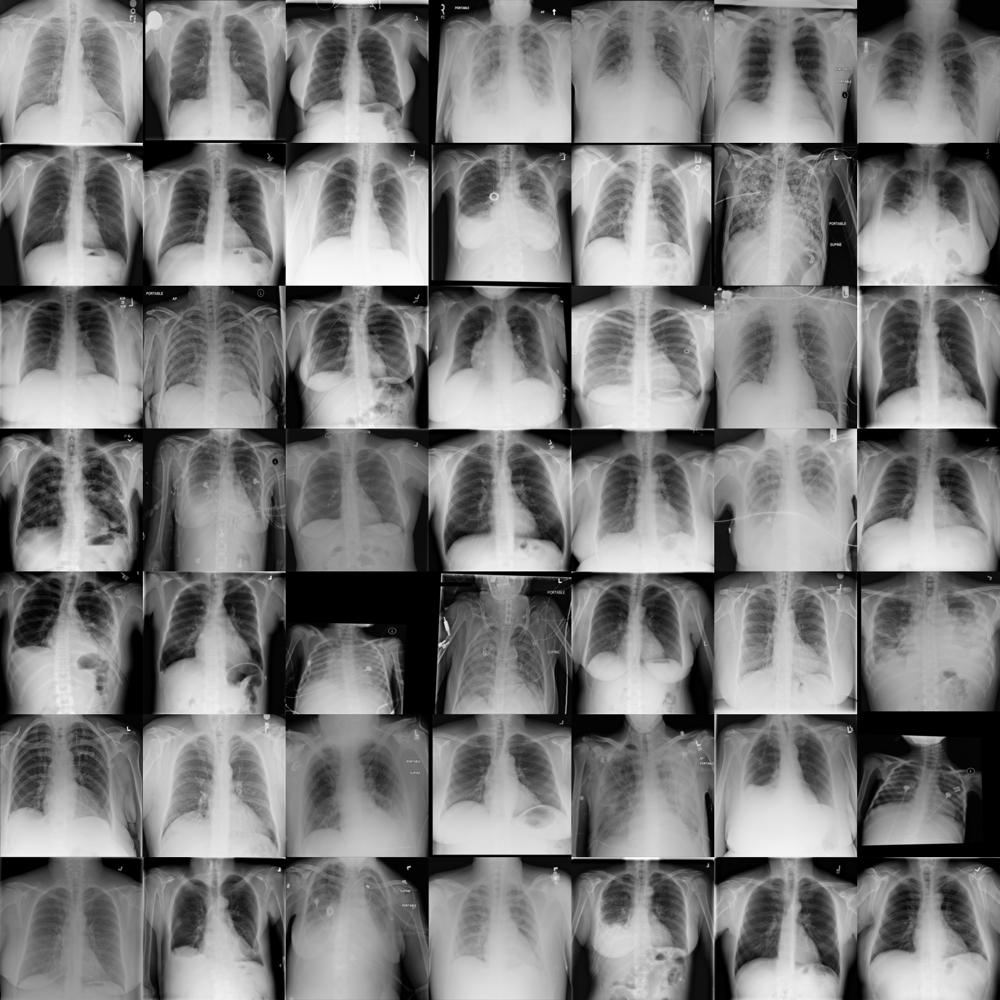

Test Dataset:
Dataset ChestMNIST of size 224 (chestmnist_224)
    Number of datapoints: 22433
    Root location: /Users/mguender/.medmnist
    Split: test
    Task: multi-label, binary-class
    Number of channels: 1
    Meaning of labels: {'0': 'atelectasis', '1': 'cardiomegaly', '2': 'effusion', '3': 'infiltration', '4': 'mass', '5': 'nodule', '6': 'pneumonia', '7': 'pneumothorax', '8': 'consolidation', '9': 'edema', '10': 'emphysema', '11': 'fibrosis', '12': 'pleural', '13': 'hernia'}
    Number of samples: {'train': 78468, 'val': 11219, 'test': 22433}
    Description: The ChestMNIST is based on the NIH-ChestXray14 dataset, a dataset comprising 112,120 frontal-view X-Ray images of 30,805 unique patients with the text-mined 14 disease labels, which could be formulized as a multi-label binary-class classification task. We use the official data split, and resize the source images of 1×1024×1024 into 1×28×28.
    License: CC BY 4.0


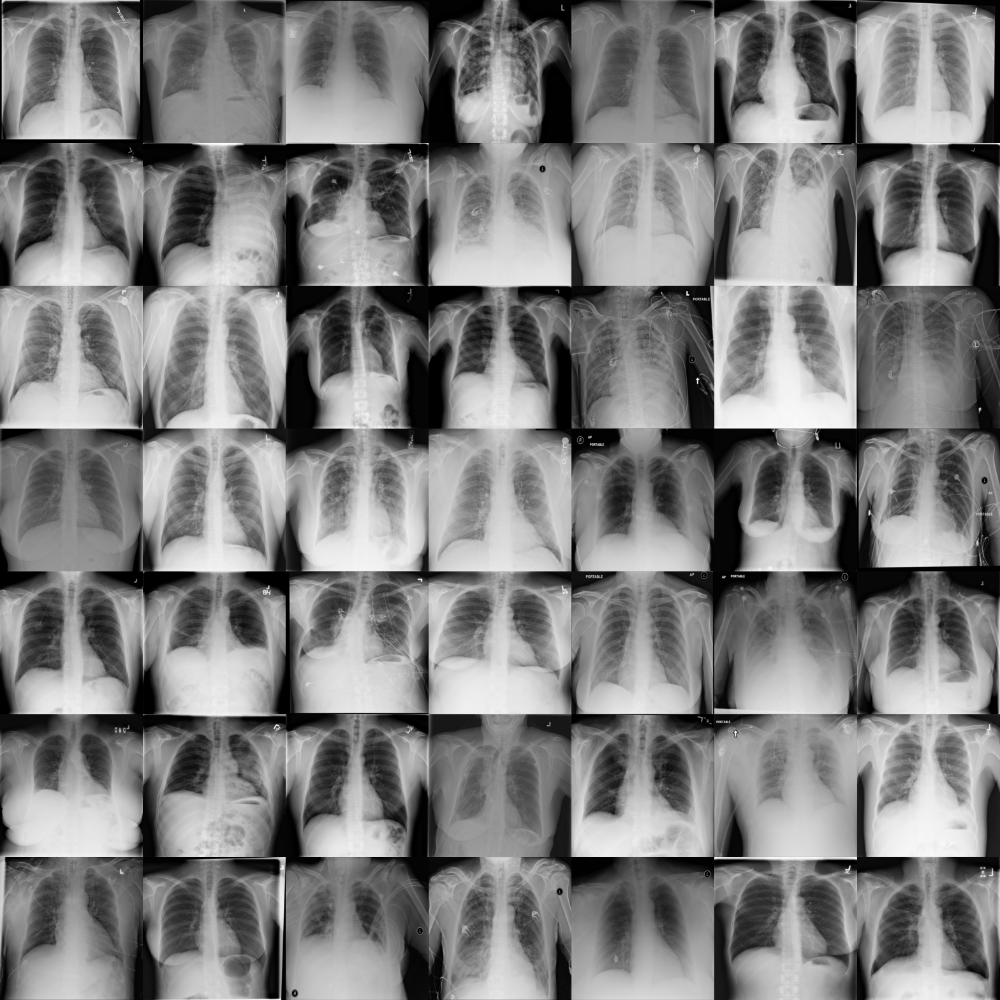

In [13]:
# Visualize properties and qualitative samples of training-set:
print("Training Dataset:")
print(train_dataset)
display(train_dataset.montage(length=7))
print("=======================================================")
# Visualize properties and qualitative samples of validation-set:
print("Validation Dataset:")
print(validation_dataset)
display(validation_dataset.montage(length=7))
print("=======================================================")
# Visualize properties and qualitative samples of test-set:
print("Test Dataset:")
print(test_dataset)
display(test_dataset.montage(length=7))
print("=======================================================")

What difference can you observe in the ChestMNIST dataset?

The ChestMNIST dataset is a so-called "multi-label" dataset.

* What is the difference between a "multi-label" and a "multi-class" problem?

Now, we have a look into how the labels are represented in the dataset.

* Print out the labels of a few instances and find out, how the labels are represented

The labels are represented in a so-calles "multi-hot" encoding. This is a binary label vector where a "0" means absence and "1" means presence of the respective disaese.

* Why is that convenient if you think about model training?

Again, we can count the label abundances but with another strategy than before.

* Try to find a efficient way to calculate the counts of each label by avoiding explicit loops
* Plot the results again in a stacked bar diagram
* What can you observe?

In [14]:
import numpy as np

# Calculate class counts for each split
train_counts = np.sum(train_dataset.labels, axis=0)
val_counts = np.sum(validation_dataset.labels, axis=0)
test_counts = np.sum(test_dataset.labels, axis=0)

labels_names = list(train_dataset.info["label"].values())

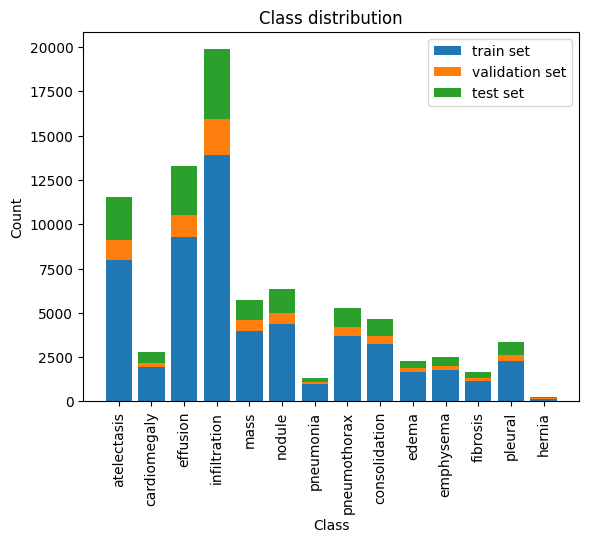

In [15]:
# Advanced: Create a stacked bar plot
fig, ax = plt.subplots()
ax.bar(labels_names, train_counts, label="train set")
ax.bar(labels_names, val_counts, bottom=train_counts, label="validation set")
ax.bar(labels_names, test_counts, bottom=train_counts + val_counts, label="test set")

ax.set_xlabel("Class")
ax.set_ylabel("Count")
ax.set_title("Class distribution")
ax.tick_params(axis="x", labelrotation=90)
ax.legend()

plt.show()

Since we have a multi-label problem here, it is hard to isolate one disease from another. However, we can do a more interesting thing! What about observing, if there are combinations of diseases that are more common than others or find correlations? A nice way of doing that is to calculate the correlation matrix. 

* Calculate the correlation matrix of the training labels.
* Plot the correlation matrix

In [16]:
corr_mat = np.corrcoef(train_dataset.labels, rowvar=False)

/var/folders/rl/1rc25qcj7sd143wpczkdg_tw000bsl/T/ipykernel_27156/2876449843.py:10: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


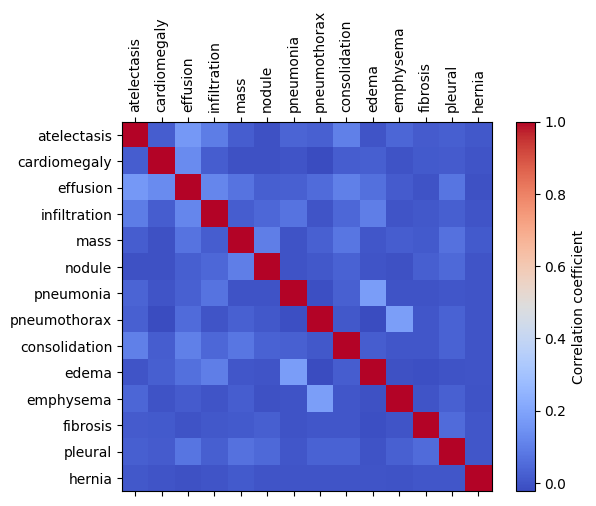

In [17]:
# plot the correlation matrix
fig, ax = plt.subplots()
cax = ax.matshow(corr_mat, cmap="coolwarm")
cbar = fig.colorbar(cax)
cbar.set_label("Correlation coefficient")
ax.set_xticks(np.arange(len(labels_names)))
ax.set_yticks(np.arange(len(labels_names)))
ax.set_xticklabels(labels_names, rotation=90)
ax.set_yticklabels(labels_names)
fig.show()

### if you are interested ...

There are some more interesting Python packages for data exploration and manipulation than `numpy` and `matplotlib`. Here, we briefly mention some recommendable packages.

#### [`pandas`](https://pandas.pydata.org)
Pandas is a comprehensive library for data analysis with python. It offers efficient data structures and data manipulation methods for mainly numerical structured or tabular data. Additionally, it includes some visualization functions.

#### [`seaborn`](https://seaborn.pydata.org)
Seaborn is a library for statistical data visualization. It is based on matplotlib and complements it regarding convenience functions for plotting and advanced design options enabling efficient data exploration.

#### [`scipy`](https://scipy.org)
  SciPy is one of the fundamental libraries for scientific computation with Python. It offers lots of algorithms and functions for optimization, integration, interpolation, linear algebra, differential equations, etc.
  
#### [`scikit image`](https://scikit-image.org)
  Scikit-image is a collection of algorithms for image processing and manipulation in Python. It offers functions in the context of image segmentation, geometric transforms, color manipulations, filtering, feature extraction and generation, etc.